In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
# def crop(img, ax0_min, ax0_max, ax1_min, ax1_max):
#     ax0_size = ax0_max - ax0_min
#     ax1_size = ax1_max - ax1_min
#     ax0_start = int(max(0, ax0_min - ax0_size*2))
#     ax1_start = int(max(0, ax1_min - ax1_size*2))
#     cropped = img[ax0_start: ax0_start + ax0_size *
#                   5, ax1_start: ax1_start + ax1_size*5]

In [3]:
filename = '../csv_detection_info/18_1, artrose.csv'
filename_clean = '../csv_detection_info_clean/18_1, artrose.csv'
saved_cropped_image = '//nmbu.no/LargeFile/Project/CubiAI/preprocess/cropped/18/1, artrose'

In [4]:
detection_df = pd.read_csv(filename)

In [5]:
detection_df

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,year,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,1092,1276,1630,1813,0.999756,18,1,"1, artrose"
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,723,900,1849,2025,0.999914,18,1,"1, artrose"
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,511,684,1561,1735,0.981587,18,1,"1, artrose"
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,1326,1551,1761,1986,0.892366,18,1,"1, artrose"
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1054539791.10.0.0.104.59...,880,1087,1190,1398,0.999220,18,1,"1, artrose"
...,...,...,...,...,...,...,...,...,...,...
280,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.938740721.40671.26179.40191.32816.4...,904,1097,1525,1718,0.999997,18,1,"1, artrose"
281,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.956608784.21248.29770.36110.30610.1...,873,1075,1602,1804,0.994830,18,1,"1, artrose"
282,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.963935516.65123.53064.42401.31751.6...,999,1195,1413,1610,0.999992,18,1,"1, artrose"
283,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,2.16.840.1.114440.1.2.1.632.3732.20180131.9525...,350,496,630,777,0.999999,18,1,"1, artrose"


### [Optional] Sort by confidence (filter out bad prediction)

In [6]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [7]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([10, 55, 60, 61, 92, 176, 209, 257, 260], dtype='int64')

Note that there is one case that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [8]:
# plot every 9 of them

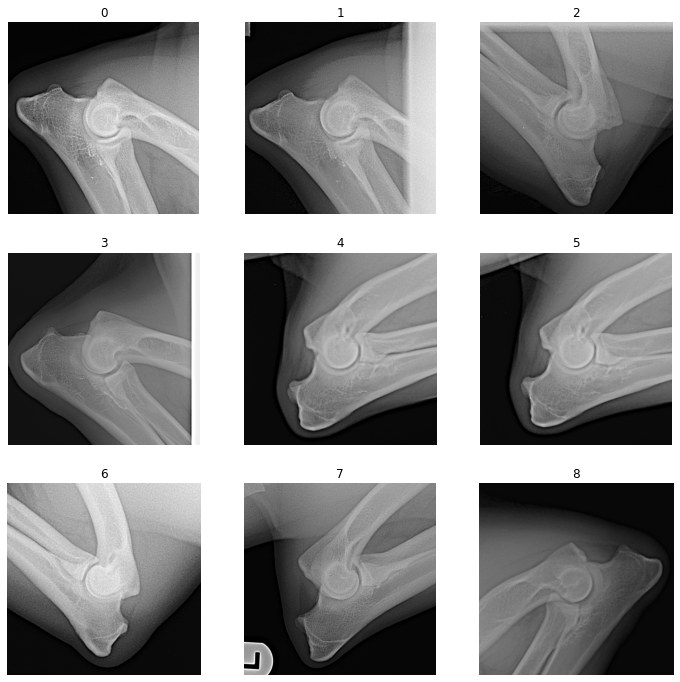

C:\NMBU\TEMP\ipykernel_15964\89006417.py:5: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')
C:\NMBU\TEMP\ipykernel_15964\89006417.py:5: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')


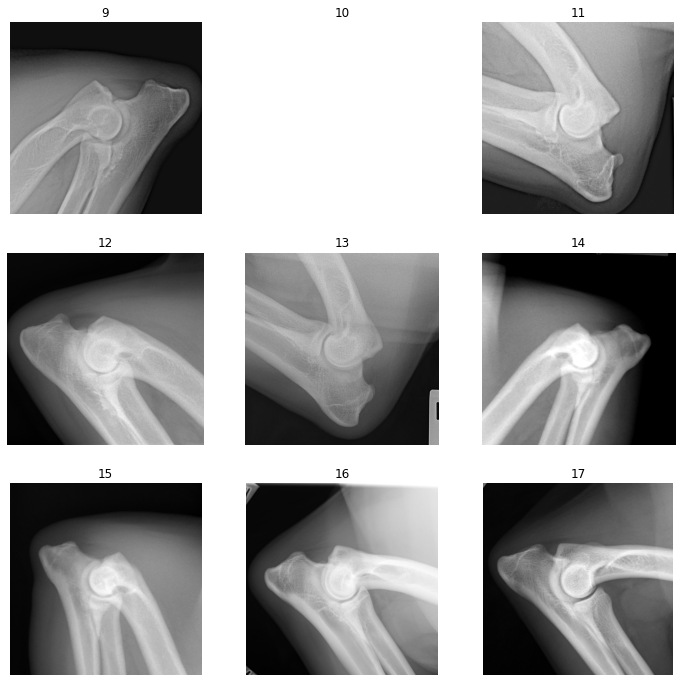

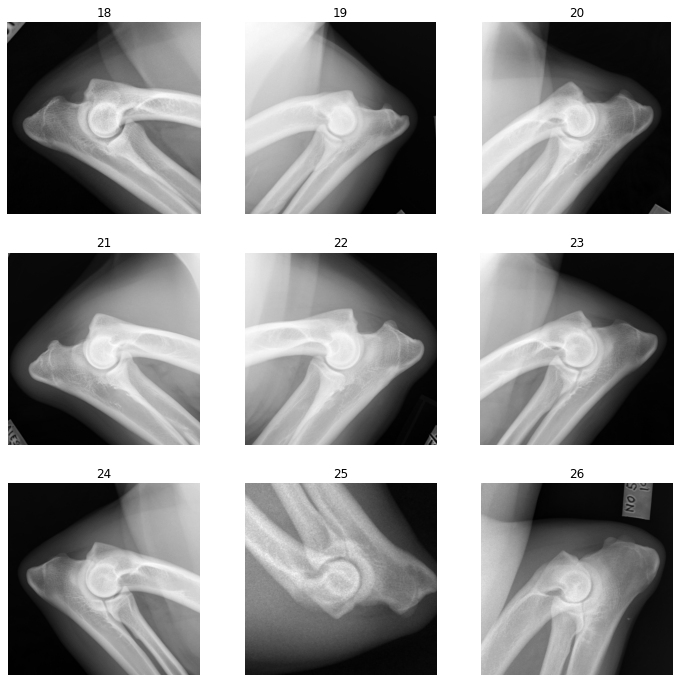

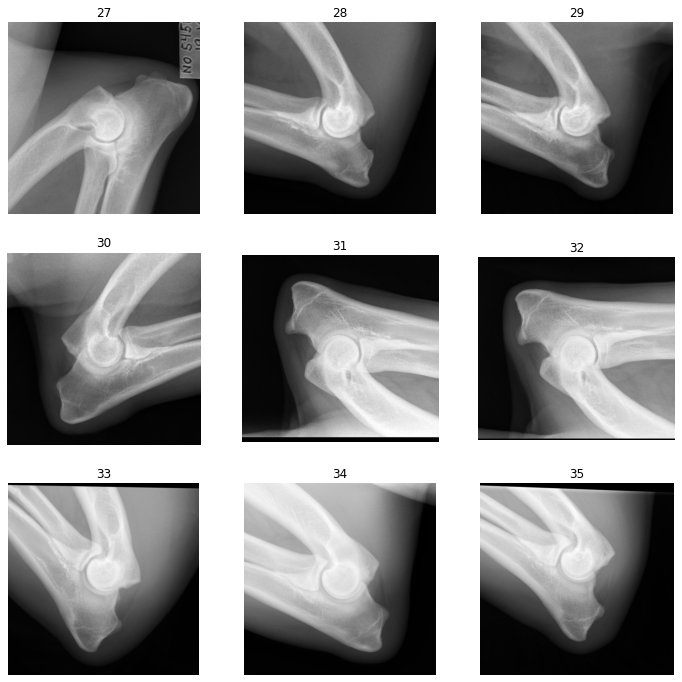

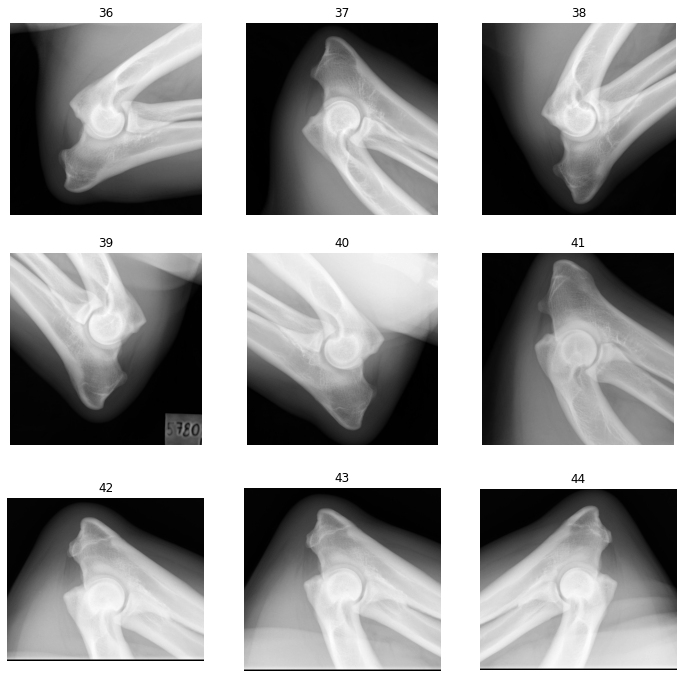

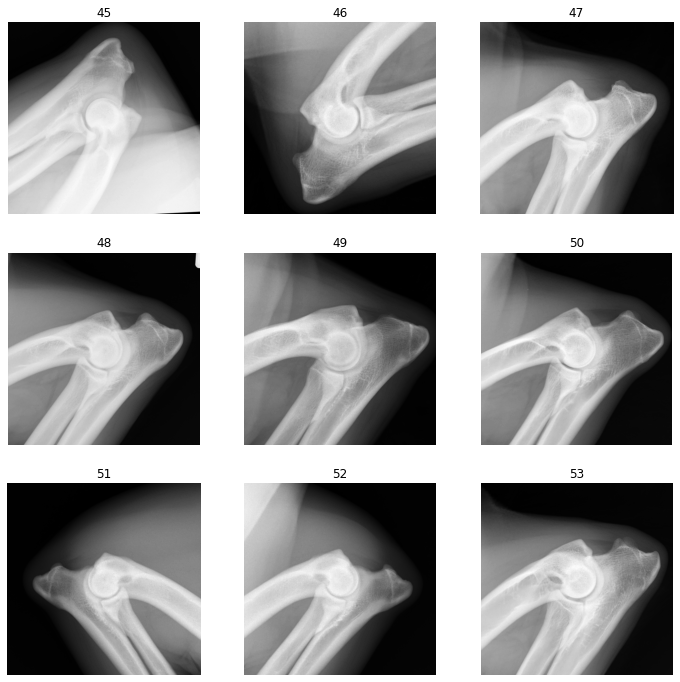

...

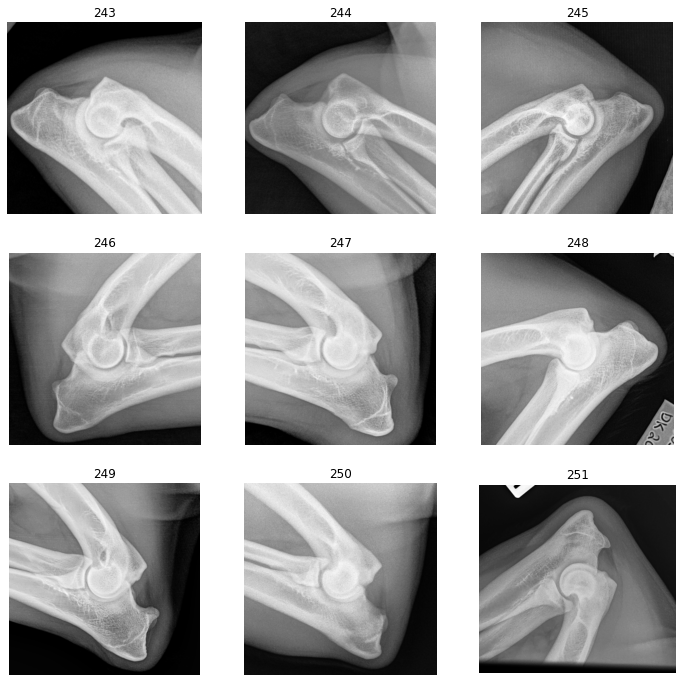

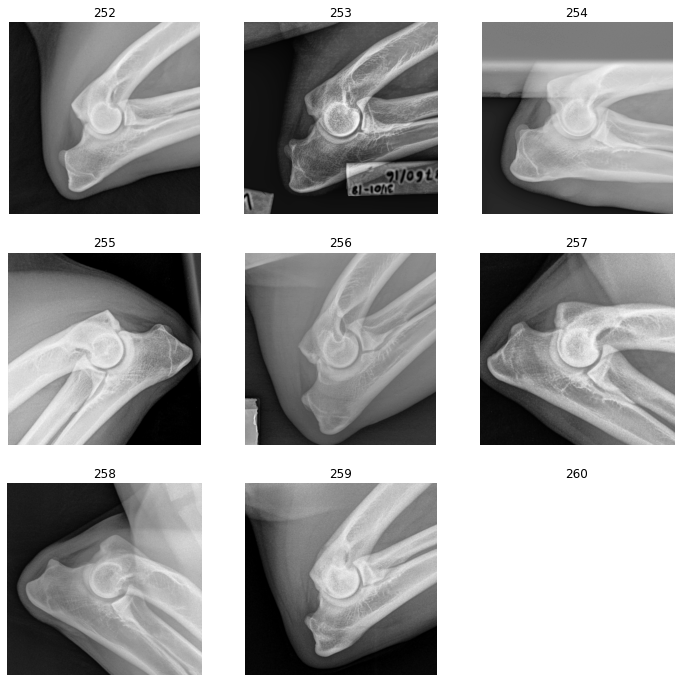

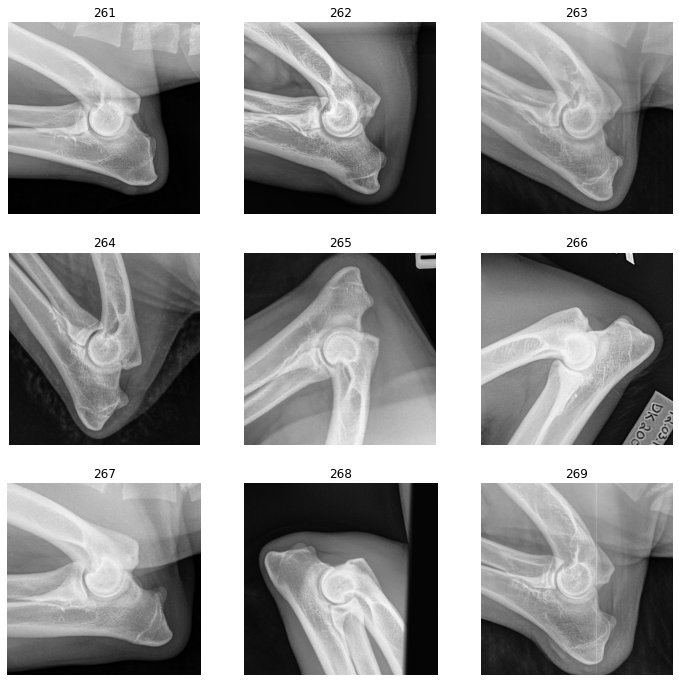

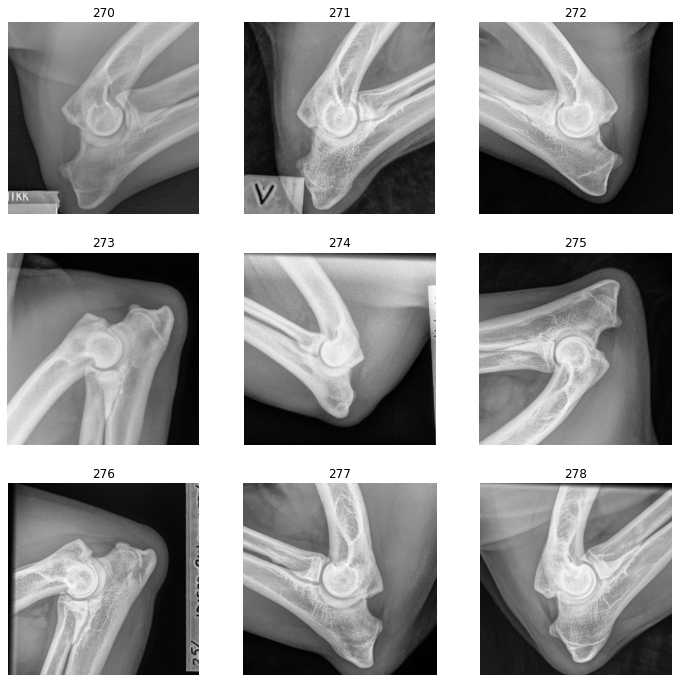

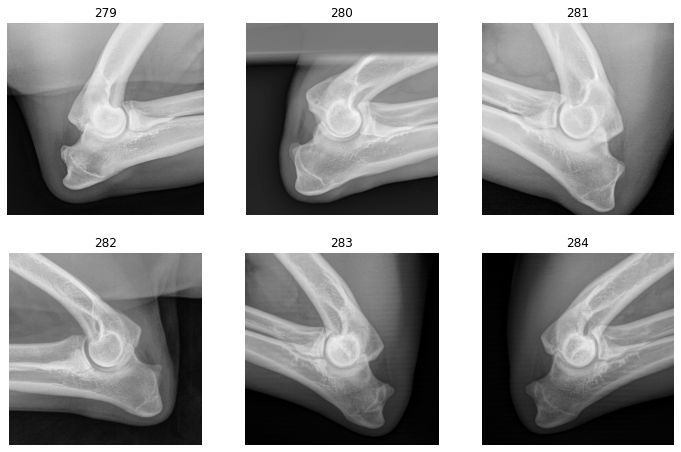

In [9]:
for id, item in detection_df.iterrows():
    fn = item['filename']
    img = np.load(saved_cropped_image + '/' + fn + '.npy')
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id))
    
    if (id%9) == 8:
        plt.show()
        
plt.show()

## Remove bad detection items

In [10]:
remove_indice = [10, 55, 60, 61, 92, 260]
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,year,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,1092,1276,1630,1813,0.999756,18,1,"1, artrose"
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,723,900,1849,2025,0.999914,18,1,"1, artrose"
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,511,684,1561,1735,0.981587,18,1,"1, artrose"
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,1326,1551,1761,1986,0.892366,18,1,"1, artrose"
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1054539791.10.0.0.104.59...,880,1087,1190,1398,0.999220,18,1,"1, artrose"
...,...,...,...,...,...,...,...,...,...,...
280,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.938740721.40671.26179.40191.32816.4...,904,1097,1525,1718,0.999997,18,1,"1, artrose"
281,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.956608784.21248.29770.36110.30610.1...,873,1075,1602,1804,0.994830,18,1,"1, artrose"
282,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.963935516.65123.53064.42401.31751.6...,999,1195,1413,1610,0.999992,18,1,"1, artrose"
283,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,2.16.840.1.114440.1.2.1.632.3732.20180131.9525...,350,496,630,777,0.999999,18,1,"1, artrose"


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
new_detection_df.to_csv(filename_clean, index=False)